# Abstract

Here we investigate the expected ability of a new remote-sensing stand-off infrared spectrometer, *Enfys*, for the ExoMars Rosalind Franklin Rover, to resolve diagnostic features of the reflectance spectra of key minerals previously identified on the surface of Mars, using the Spectral Angle as a metric.

In this notebook we simulate Enfys performance using an InAs Mid-Wave Infrared (1.6 - 3.1 µm, 'MWIR') sensor, that is subject to thermal noise from the Enfys structure.

Here we consider a worst case scenario where an SNR of 1/10th of the expected performance is achieved in the InAs channel.

# Introduction

As discussed in [previous notebooks](./Simulating%20Spectral%20Sampling%20of%20the%20MICA%20Files%20with%20the%20Enfys%20IR%20Spectrometer%20for%20the%20ExoMars%20Rosalind%20Franklin%20Rover.ipynb), Enfys is an Infra-Red point-spectrometer for the ExoMars Rosalind Franklin rover.

In this notebook, and the others accompanying it, we explore how we expect Enfys to sample Minerals Identified through CRISM Analysis, as defined by the ['MICA' files](http://crism.jhuapl.edu/data/mica/).

In this notebook, we consider the expected performance of Enfys using an InAs Mid-Wave Infrared sensor for the wavelength range of 1.6 - 3.1 µm.
Included in the modelling is the noise expected for the sensor, as provided by the EXM-EN-MTX-ABU-0001_Enfys_Science_Traceability_Matrix_3-0 document (contact Enfys P.I. M. Gunn).


## Problem
The optical design of Enfys is functionally different to the Acousto-Optic Tunable Filter design of it's predecessor ISEM, so it is important that the design is demonstrated to fulfil the performance requirements of the instrument, and that expectations of performance can be set prior to laboratory tests of the completed instrument.

At time of writing, the spectrometer is in the development stage. This notebook describes how the Spectral Parameters Toolkit[^stabbins2024] can be used to convert the developing expectations of the spectral range and resolution and radiometric sensitivity of the instrument into predictions of its ability to discriminate mineral species and phases on the Mars surface at the rover landing site.

In these notebooks we consider two candidate MWIR sensors, that trade-off spectral range against Signal-to-Noise Ratio.

Candidate A is the InAs sensor, simulated here, that is sensitive up to ~3.1 µm, with a nominal SNR range of 100 - 600.

Candidate B is a modified InGaAs sensor, sensitive to ~2.5 µm, with a nominal SNR range of ~2000 - 60,000.

Here we consider a worst-case-scenario where the InAs sensor only acheives 1/10th of the nominal SNR. This is to approximate uncertainty in the thermal state of the instrument enclosure, that is the dominant source of thermal noise.

[^stabbins2024]: Stabbins, R., & Grindrod, P. (2024). The Spectral Parameters Toolkit (sptk): Release v0.1 (Version v0.1) [Computer software]. Zenodo. https://doi.org/10.5281/zenodo.10694286


# Method

To investigate the expected performance we use high-resolution laboratory measured spectra of a range of minerals expected at the Mars surface, and computationally simulate the sampling of the spectra with the expected spectral response of *Enfys*. We will perform repeat sampling with synthetically added noise to investigate the spectral and radiometric limits of the instrument.

We will produce a number of visualisations to investigate the predicted instrument performance, and demonstrate the limits of the instrument discriminatory ability.

We will quantify the ability of the instrument to resolve the defined minerals of interest by computing the Spectral Angle between a noisy sampled spectrum of a given mineral and all other 'clean' (resampled to Enfys spectral channels, but without noise added). We will compare the noisy sample Spectral Angle to a noise-free baseline Spectral Angle, to understand the performance limits and the impact of the simulated instrument noise.

## Spectral Resampling
We take a simple approach to resampling, as follows. 

We neglect reflectance calibration uncertainty, and any systematic uncertainty when merging the data from the two separate photodiodes, and assume that the linear-variable filter (LVF) movement is perfectly calibrated such that a measurement at centre-wavelength $\lambda_{cwl}$ can be requested with arbitrary precision.

We assume an observation of $\lambda_{cwl}$ has a Cauchy transmission profile. We use the latest expectations of the spectral resolving power of the short-wave infrared (SWIR) and mid-wave infrared (MWIR) LVFs, that we have linearly interpolated from ~30 measurements from 0.9 - 2.6 µm to arbitrary values of $\lambda$ in the SWIR and MWIR ranges, to give the vector $\Gamma[\lambda]$. The Cauchy transmission profile for a given $\lambda_{cwl}$ has a full-width-at-half-maximum of $\Delta\lambda = \lambda_{cwl}/\Gamma[\lambda_{cwl}]$.

This data has been digitsed from the plot reported in the `Enfys schedule review 20250807.ppt`, by Matt Gunn.

In [8]:
import pandas as pd

enfys_swir_respow = pd.read_csv('../data/instruments/enfys_swir_respow.csv', index_col=0)
enfys_mwir_respow = pd.read_csv('../data/instruments/enfys_mwir_respow.csv', index_col=0)
g=enfys_swir_respow.plot(label='SWIR', marker='o')
enfys_mwir_respow.plot(marker='o',label='MWIR', xlabel='Wavelength (nm)', ylabel=r'$\lambda/\Delta\lambda$ Resolving Power',ax=g)
g.legend(['SWIR', 'MWIR'])
title = g.set_title('Enfys SWIR & MWIR Spectral Resolving Power $\Gamma[\lambda]$')

**Figure 1** Enfys SWIR & MWIR Spectral Resolving Power $\Gamma[\lambda]$, extracted from `Enfys schedule review 20250807.ppt`, M. Gunn.


The Cauchy transmission profile $T(\lambda|\lambda_{cwl})$ is given by

$$
T(\lambda|\lambda_{cwl}) = \frac{\gamma^2}{(\lambda - \lambda_{cwl}^2) + \gamma^2}
$$

where $\gamma = \Delta\lambda/2 = (\lambda_{cwl}/\Gamma[\lambda_{cwl})/2$.

The shape of the Cauchy profile is illustrated here.

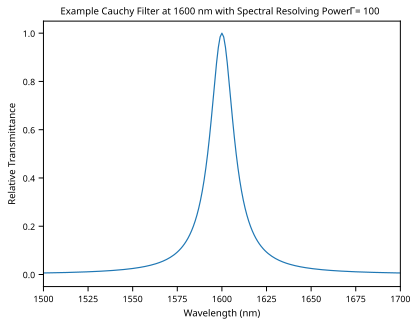

In [9]:
from sptk.instrument import Instrument
import sptk.config as cfg
from matplotlib import pyplot as plt

exmpl_cauchy = Instrument.build_cauchy_filter(1600, 1600/100)
plt.plot(cfg.WVLS, exmpl_cauchy.squeeze())
plt.xlim(1500, 1700)
plt.xlabel('Wavelength (nm)')
plt.ylabel('Relative Transmittance')
title = plt.title('Example Cauchy Filter at 1600 nm with Spectral Resolving Power $\Gamma$ = 100')

**Figure 2** Example Cauchy Filter transmission profile, at 1600 nm with Spectral Resolving Power $\Gamma$ = 100.


We assume that a high-resolution laboratory spectrum approximates the continuous function $R(\lambda)$, such that the calibrated reflectance at $\lambda_{cwl}$ has the expected value $R[\lambda_{cwl}]$ of:

$$
R[\lambda_{cwl}] = \frac{\int R(\lambda)T(\lambda|\lambda_{cwl}) d\lambda }{\int T(\lambda|\lambda_{cwl}) d\lambda}
$$

We use this equation to compute the Enfys-sampled reflectance spectra.

## Adding Noise

To simulate noise we add $\varepsilon$ to a reflectance measurement, an additive noise term drawn from the Gaussian distribution with standard deviation $\sigma$, that we define relative to the specified Signal-to-Noise Ratio ($\text{SNR}$),

$$\sigma = \frac{S}{\text{SNR}}$$

where $S$ is the signal.

The supplied Signal-to-Noise Ratio vector has been defined under the assumption of a 30% albedo spectrally uniform reflector. 

The expected spectral SNR of the SWIR and MWIR sensors has been measured and processed by P.I. M. Gunn, and reported in the `EXM-EN-MTX-ABU-0001_Enfys_Science_Traceability_Matrix_3-0` spreadsheet.

We read in the SNR file, and get the SNR data for the InAs MWIR sensor and the InGaAs SWIR sensor,

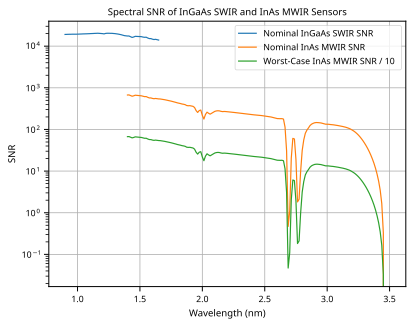

In [10]:
enfys_snr = pd.read_csv('../data/instruments/enfys_snr.csv', index_col=0)
inas_mwir_snr = enfys_snr['InAs MWIR SNR']
ingaas_swir_snr = enfys_snr['InGaAs SWIR SNR']

g = ingaas_swir_snr.plot(grid=True, label='Nominal InGaAs SWIR SNR')
inas_mwir_snr.plot(logy=True, grid=True, label='Nominal InAs MWIR SNR')
(inas_mwir_snr/10).plot(logy=True, grid=True, label='Worst-Case InAs MWIR SNR / 10')
g.set_xlabel('Wavelength (nm)')
g.set_ylabel('SNR')
g.legend()
title = g.set_title('Spectral SNR of InGaAs SWIR and InAs MWIR Sensors')

**Figure 3** Spectral Signal-to-Noise Ratio for InGaAs SWIR and InAs MWIR Sensors, extracted from `EXM-EN-MTX-ABU-0001_Enfys_Science_Traceability_Matrix_3-0` spreadsheet, M. Gunn, and the 1/10th SNR performance simualted in this notebook.


We assume that this SNR vector is modulated by the reflectance of the mineral of interest, such that $\sigma$ as a function of the spectral Signal-to-Noise Ratio $\text{SNR}[\lambda]$ is:

$$\sigma[\lambda] = \frac{R[\lambda]}{\text{SNR}[\lambda]}$$


For each observation $R[\lambda_{cwl}]$ we draw $n$-repeat noisy samples $\tilde{R}_i[\lambda_{cwl}]$, such that

$$
\tilde{R}_i[\lambda_{cwl}] = R[\lambda_{cwl}] + \varepsilon_i[\lambda_{cwl}]
$$

with 

$$
\varepsilon_i[\lambda_{cwl}] \sim \mathcal{N}\left(0, \sigma[\lambda_{cwl}] \right)
$$

This gives an indication of the expected noise of a calibrated *Enfys* acquired spectrum.


## Analysis

First we produce plots of the resampled spectra, and single instances of noisy spectra, and visually inspect these to consider the ability of this Enfys configuration to resolve diagnostic spectral features against the noise.

### Spectral Angle

We then take a single noisy sample and evaluate the Spectral Angle between the noisy sample and each noise-free entry of the MICA files spectral database that we are sampling. We repeat this for each noisy sample, to give the mean Spectral Angle and it's uncertainty, to determine the ability to dicriminate between similar mineral reflectance spectra.

The Spectral Angle is defined[^kruse1993] between the noisy spectrum $\tilde{R}_i[\lambda]$ of material $i$ in the set of MICA file materials ($\mathcal{M}$) and the clean spectrum $R_j[\lambda]$, where $j \in \mathcal{M}$.

The Spectral Angle $\theta$ is:

$$\theta(i,j) = \arccos \left( \frac{\sum_{\lambda} \tilde{R}_i[\lambda] {R}_j[\lambda]}{ \left(\sum_{\lambda} \tilde{R}_i[\lambda]^2 \right)^{1/2} \left(\sum_{\lambda} R_j[\lambda]^2 \right)^{1/2} }  \right) $$

This closed form expression can be formulated in a way such that $\theta$ can be computed for all $\mathcal{M}$ for a given material $i$ in parallel, as well as multiple noisy repeat samples of $i$.

[^kruse1993]: F.A. Kruse, A.B. Lefkoff, J.W. Boardman, K.B. Heidebrecht, A.T. Shapiro, P.J. Barloon, A.F.H. Goetz, The spectral image processing system (SIPS)—interactive visualization and analysis of imaging spectrometer data, Remote Sensing of Environment, Volume 44, Issues 2–3, 1993, Pages 145-163, ISSN 0034-4257, https://doi.org/10.1016/0034-4257(93)90013-N

## Notebook and Environment Setup

Here we include the required code blocks for setting up this notebook for this study.

In [11]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'svg' # note - requires Inkscape to be installed, and to be accessible from the terminal
# on macos, add inkscape to the path with `sudo ln -s /Applications/Inkscape.app/Contents/MacOS/inkscape /usr/local/bin/inkscape`
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


We will be using the Spectral Parameters Toolkit. First we import the required modules.

In [12]:
import sptk.config as cfg
from sptk.material_collection import MaterialCollection
from sptk.instrument import Instrument
from sptk.observation import Observation
from sptk.spectral_library_analyser import SpectralLibraryAnalyser as sla

We set our simulation resolution range to extend the range of Enfys, of 0.9 - 3.1 µm, such that the long tails of the Cauchy distribution of the linear-variable-filter profiles can be accommodated during sampling. We leave our spectral resolution at 1 nm for all $\lambda$.

In [13]:
cfg.update_sample_res('wvl_min', 800)
cfg.update_sample_res('wvl_max', 3300)

Finally we set the project name.

In [14]:
PROJECT_NAME = 'enfys_mica_inas_mwir_snr10x'

# Data

For this study we are using a spectral library of minerals identified through CRISM analysis ([the MICA files](http://crism.jhuapl.edu/data/mica/))[^viviano-beck2014]. Here we use the laboratory spectra that have been identified that best represent the type localities presented in the MICA files. These can be accessed [here](https://crismtypespectra.rsl.wustl.edu/), and are sourced from the RELAB and USGS public spectral libraries.

A comprehensive description of the mineral groups can be found in the [^viviano-beck2014] text.

Here we have omitted the CO2 and H2O ice entries, as tabulated laboratory data is not publicly available.

[^viviano-beck2014]: Viviano-Beck, C. E., Seelos, F. P., Murchie, S. L., Kahn, E. G., Seelos, K. D., Taylor, H. W., Taylor, K., Ehlmann, B. L., Wiseman, S. M., Mustard, J. F., & Morgan, M. F. (2014). Revised CRISM spectral parameters and summary products based on the currently detected mineral diversity on Mars. Journal of Geophysical Research: Planets, 119(6), 1403–1431. https://doi.org/10.1002/2014JE004627


We have grouped the spectral library into categories as follows, and included this categorisation in the sptk distribution, accessed from the ```sptk.material_sets``` module.

In [15]:
from sptk.material_sets import MICA_SET

We use the ```sptk.material_collection``` module to parse the spectral library:

In [16]:
matcol = MaterialCollection(
        MICA_SET,
        'MICA_new_dirtree', 
        PROJECT_NAME, 
        load_existing=False,
        balance_classes=False,
        random_bias_seed=None,
        allow_out_of_bounds=True,
        plot_profiles=False,
        export_df=True)

Building new enfys_mica_inas_mwir_snr10x MaterialCollection DF

---------------------------------
Category
└──species|subgroup|group|
   └──data_id status
---------------------------------
Iron Oxides & Primary Silicates
└──-clinopyroxene|pyroxenes|inosilicates|
   └──-NBPP22.csv loaded
└──-orthopyroxene|pyroxenes|inosilicates|
   └──-LAPP47B.csv loaded
└──-fayalite|olivines|nesosilicates|
   └──-LAPO05.csv loaded
└──-forsterite|olivines|nesosilicates|
   └──-LASC02.csv loaded
└──-hematite|hematites|oxides|
   └──-GDS27.csv loaded
└──-plagioclase|feldspars|tectosilicates|
   └──-NCLS04.csv loaded
---------------------------------
Sulfates
└──-alunite|hydrous_sulphates|sulphates|
   └──-F1CC08B.csv loaded
└──-bassanite|hydrous_sulphates|sulphates|
   └──-GDS145.csv loaded
└──-gypsum|hydrous_sulphates|sulphates|
   └──-LASF41A.csv loaded
└──-jarosite|hydrous_sulphates|sulphates|
   └──-LASF21A.csv loaded
└──-kieserite|hydrous_sulphates|sulphates|
   └──-F1CC15.csv loaded
└──-mg-sulphate|

We can use the ```material_collection``` plotting routines to visualise the library.

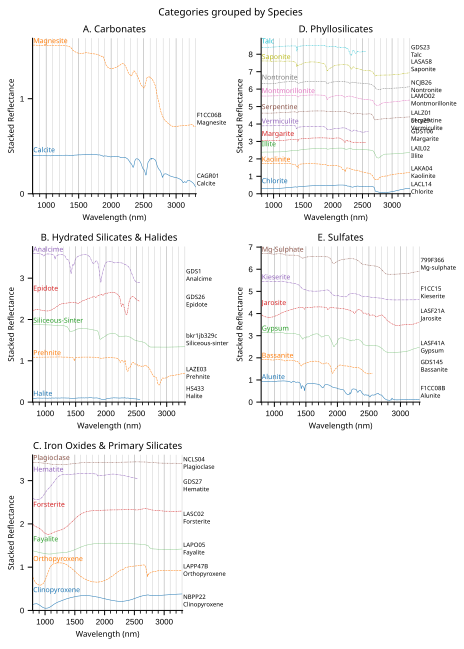

In [17]:
ax = matcol.plot_profiles(stacked=True, scope='categories', groupby='Species')

**Figure 4** High resolution MICA Files spectral library, arranged by category and grouped by mineral species.

We can see that not all of the entries cover the complete 0.9 - 3.1 µm range of *Enfys*, so in future work we should look to replace these MICA files laboratory type spectra with spectra that all span the entire range.

We can show band locations more clearly after continuum removal. We can use the `SpectralLibraryAnalyser.remove_continuum()` function to produce a duplicate of the `MaterialCollection` but with the data continuum-removed.

In [18]:
from sptk.spectral_library_analyser import SpectralLibraryAnalyser as sla

matcol_sla = sla(matcol)
matcol_cr = matcol_sla.remove_continuum()

We can plot the profiles to illustrate the continuum removal.

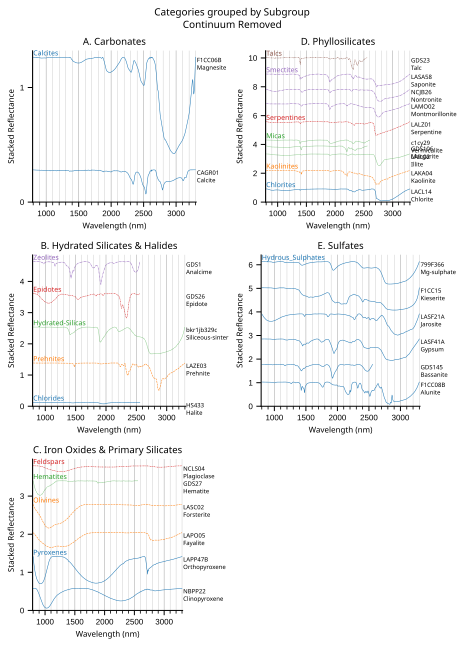

In [83]:
axes = matcol_cr.plot_profiles(stacked=True, scope='categories', groupby='Subgroup')

**Figure 5** Continuum-removed high resolution MICA Files spectral library, grouped by Category.

We can illustrate the band locations more clearly with the 'waterfall' visualisation:

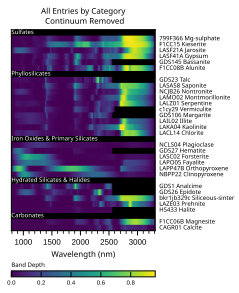

In [20]:
axes = matcol_cr.plot_profiles(waterfall=True, scope='all', groupby='Category')

**Figure 6** Continuum-removed waterfall plot of high resolution MICA Files spectral library, grouped by Category.

We can see that the waterfall plot represents the band depth information of the `MaterialCollection` in a compact format. Scanning vertically allows for quick identification of common band locations, their depths, widths, and asymmetries.

## Simulating the Enfys Spectral Response

To simulate Enfys, rather than providing a file with the expected spectral response of each position of the Linear-Variable Filter (LVF, above), we specify the spectral range and resolution and sampling regime, and generate a set of central-wavelengths and bandwidths. We do this with the ```InstrumentBuilder``` class of the ```sptk.instrument``` module.

In [21]:
from sptk.instrument import InstrumentBuilder

### Signal-to-Noise Ratio

Previously we loaded the spectral SNR, as extracted from the current version of the Enfys STM. Here we merge the SWIR and MWIR SNR datasets, and prepare the data for passing to the `sptk.Instrument` constructor.

We have adapted the InstrumentBuilder function to accept a pandas Series mapping wavelength to SNR. The InstrumentBuilder then performs interpolation to the simulated wavelength range.

We scale the InAs MWIR SNR by a factor of 1/10, to simulate the worst-case scenario.

In [161]:
inas_mwir_snr = inas_mwir_snr/10

We splice the SWIR and MWIR data together, using the higher value SNR where the wavelength ranges overlap:

In [162]:
# concatanate the inas_mwir_snr and the ingaas_swir, using the highest SNR for overlapping wavelength values
enfys_inas_mwir_snr = ingaas_swir_snr.combine_first(inas_mwir_snr)

We also convert the wavelengths from µm to nm:

In [163]:
enfys_inas_mwir_snr.index = enfys_inas_mwir_snr.index * 1000

for computational convenience, we should set values of SNR<=3 to NaN, to interpret these as 'bad bands'

In [164]:
# where SNR <=1 to NaN, to interpret these as 'bad bands'
import numpy as np
enfys_inas_mwir_snr = enfys_inas_mwir_snr.where(enfys_inas_mwir_snr > 3, other=np.nan)

In [165]:
enfys_inas_mwir_snr.index.name = 'wavelength'

The continuous spectral SNR for the complete instrument is:

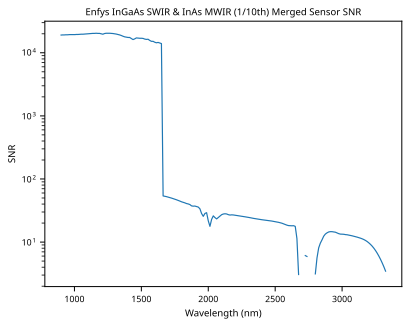

In [166]:
g = enfys_inas_mwir_snr.plot(logy=True)
# set the x and y axes
g.set_xlabel('Wavelength (nm)')
g.set_ylabel('SNR')
title = g.set_title('Enfys InGaAs SWIR & InAs MWIR (1/10th) Merged Sensor SNR')

**Figure 7** SWIR & MWIR merged spectral Signal-to-Noise Ratio input data, extracted from the current Enfys Science Traceability Matrix, maintained by M. Gunn.

### Spectral Resolving Power

Previously we loaded in the latest data for modelling the Spectral Resolving Power for the SWIR and MWIR LVFs. Here we merge the dataset, and prepare it to be passed to the `sptk.Instrument` module.

We merge the datasets, using the SWIR values where the sensor range overlaps.

In [167]:
# get the max wavelength where ingaas_swir_snr is not nan
ingaas_swir_snr = ingaas_swir_snr[~np.isnan(ingaas_swir_snr)]
max_swir_wavelength = ingaas_swir_snr.index[-1] * 1000 # convert from µm to nm
max_swir_wavelength
# get the enfys_swir_respow data where the wavelength is less than the max_swir_wavelength
enfys_swir_respow = enfys_swir_respow[enfys_swir_respow.index < max_swir_wavelength]
enfys_swir_respow
# get the enfys_mwir_respow where the wavelength is greater than the max_swir_wavelength
enfys_mwir_respow = enfys_mwir_respow[enfys_mwir_respow.index > max_swir_wavelength]
enfys_mwir_respow
# now merge the datasets
enfys_respow = pd.concat([enfys_swir_respow, enfys_mwir_respow])

The complete instrument Spectral Resolving Power is:

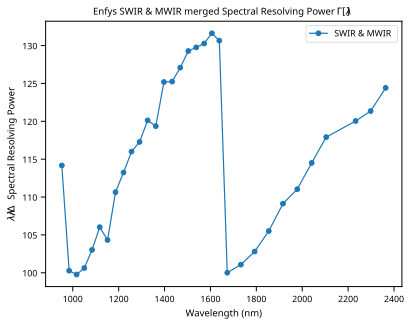

In [168]:
g=enfys_respow.plot(marker='o',xlabel='Wavelength (nm)', ylabel=r'$\lambda/\Delta\lambda$ Spectral Resolving Power')
g.legend(['SWIR & MWIR'])
title = g.set_title('Enfys SWIR & MWIR merged Spectral Resolving Power $\Gamma[\lambda]$')

**Figure 8** SWIR and MWIR merged Spectral Resolving Power data, as extracted from the `Enfys schedule review 20250807.ppt`, M. Gunn.

We pass this data to the InstrumentBuilder function.

### Instrument Build

Now we will pass this to the InstrumentBuilder, defining the spectral range as $\lambda \in [900, 3100]$ nm.

In [169]:
enfys_builder = InstrumentBuilder(
    instrument_name='enfys_inas_mwir',
    instrument_type='lvf',
    sampling='nyquist',
    resolution = enfys_respow,
    spectral_range=[900, 3101],
    snr = enfys_inas_mwir_snr)

Exporting instrument to ../data/instruments/enfys_inas_mwir.csv...


In [170]:
from sptk.instrument import Instrument

Now we build the transmission profiles for each LVF position, according to the list of CWLs and FWHMs generated above. These are accessed by reading the ```.csv``` file produced by the ```InstrumentBuilder``` procedure.

When generating the profiles, we turn the CWL and FWHM into a profile by assuming a distribution function. For Enfys we use the Cauchy distribution, under the guidance of the Enfys build team, which behaves similarly to a Gaussian, but with wider 'wings'. It is parameterised by the full-width-at-half-maximum, as the distribution strictly has no finite variance. We have implemented a ```build_cauchy_filter``` method for the ```Instrument``` class.

In [171]:
enfys = Instrument(
            name = 'enfys_inas_mwir', # filename of the instrument information, held in /software/data/instruments/            
            project_name = matcol.project_name, # the project directory name, hosting outputs in the /spectral_parameter_studies/ directory
            shape = 'cauchy',
            load_existing=False, # if True, load existing instrument data from the project directory
            plot_profiles=False, # if true, plot the transmission profiles during construction
            export_df=True) # if True, export the instrument transmission profiles to the project directory

Building Instrument...
Building new DataFrame for 'enfys_inas_mwir'...
Exporting the Instrument to CSV and Pickle formats...


Plotting Instrument Transmission...


/opt/homebrew/Caskroom/miniconda/base/envs/enfys_sptk/lib/python3.10/site-packages/seaborn/_oldcore.py:200: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


Plotting Maximum Signal-to-Noise Ratio...
Plotting FWHM...
Plotting Spectral Resolution...
Plots exported to ../projects/enfys_mica_inas_mwir_snr10x/instrument


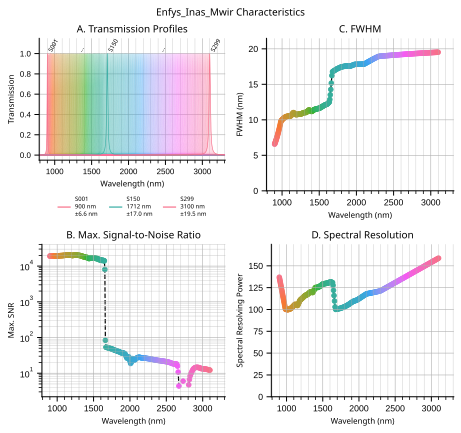

In [172]:
fig ,ax = enfys.plot_instrument_characteristics()

**Figure 9** Simulated spectral response and resolution of *Enfys*, based on preliminary expectations of the spectral and radiometric response.

The data shown in figure 9 approximates the expected performance of *Enfys*. This data represents the current component level understanding of the filter and sensor performance of the built instrument.

# Results

## Sampling MICA with Enfys

We now make an ```Observation``` object by sampling the MICA files ```MaterialCollection``` with the Enfys ```Instrument```.

In [173]:
from sptk.observation import Observation

In [174]:
obs = Observation(
    material_collection=matcol,
    instrument = enfys,
    load_existing=False,
    plot_profiles=False,
    export_df=True)

Building new Observation DataFrame                                                  for 'enfys_mica_inas_mwir_snr10x'...
Sampling the Material Collection with the Instrument...
Sampling complete.
Exporting the Observation Pickle format...
Observation export complete.


We can plot the sampled spectra against the input high-spectra below:

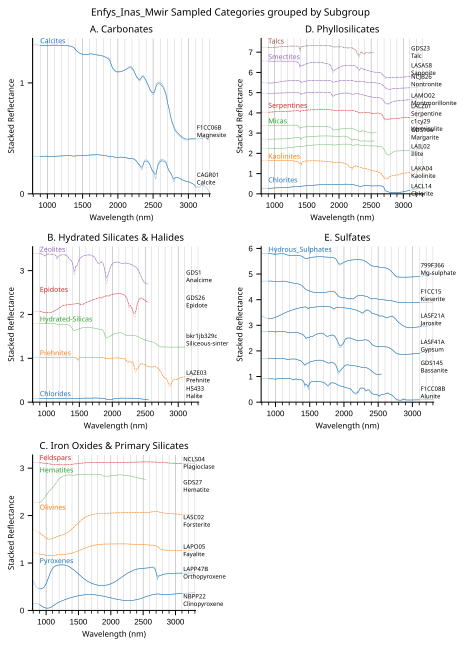

In [175]:
axes = obs.plot_profiles(scope='categories', groupby='Subgroup', stacked=True, hires_under=True)

**Figure 10** The MICA files as sampled by *Enfys*, with the original high-resolution spectra plotted underneath each.

We can now see where there are deviations of the *Enfys* sampled spectra from the high-resolution source spectra. 

For example, illite, plotted below for clarity.

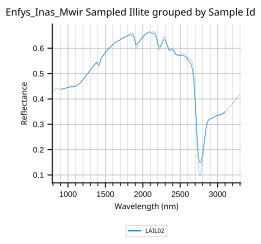

In [176]:
axes = obs.plot_profiles(scope='illite', groupby='Sample ID', stacked=False, hires_under=True)

**Figure 11** Deviation of the *Enfys* sampled spectrum from the high-resolution input spectrum for Illite.

We note that there is an effect by which peaks and troughs in the spectra are reduced. This is due to the long tails of the Cauchy filter profiles. Despite the reduction of absolute band depth, the features of Illite (fig. 8) are still resolvable.

We can produce a continuum-removed waterfall plot to check that the major bands are resolved.

In [177]:
from sptk.spectral_library_analyser import SpectralLibraryAnalyser as sla

obs_cr = sla(obs).remove_continuum()

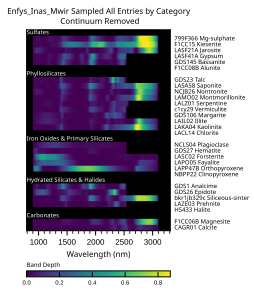

In [178]:
axes = obs_cr.plot_profiles(waterfall=True, scope='all', groupby='Category')

**Figure 12** Continuum-Removed waterfall plot of the MICA files as sampled by *Enfys*.

Comparing Figure 12 to Figure 6, we can see that the weaker sub-2 µm bands are less well resolved.

We can save this data

In [179]:
obs_cr.export_main_df()

Exporting the Observation Pickle format...
Observation export complete.


## Adding Synthetic Noise

We have the capability to add synthetic noise to the dataset, by redrawing a sample from the dataset with noise added according to the signal-to-noise ratio specified for the given channel.

We can optionally redraw multiple noisy samples for each entry, to give an indication of the statistical uncertainty, or for example draw a single noisy sample, to produce a single-observation mission-realistic dataset.

First, let's draw a single noisy entry:

In [180]:
noise_obs = obs.add_noise(1, seed=0)

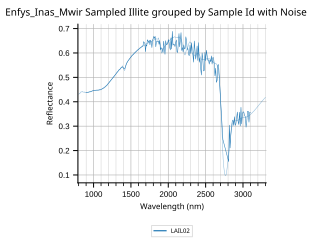

In [181]:
axes = obs.plot_profiles(scope='illite', groupby='Sample ID', stacked=False, hires_under=True, ci=False)

**Figure 13** Noisy resampled example spectrum for Illite, showing 1 noisy sample according to the spectral signal-to-noise ratio illustrated in figure 9.B.

We can illustrate this in greater deal by plotting each entry on a separate figure, with the y-axis clipped to the spectral range of entry. Note that for samples with a small spectral range (i.e. samples that are spectrally flat), this stretching will appear to amplify noise, so the y-axis range must be considered when assessing the noise.

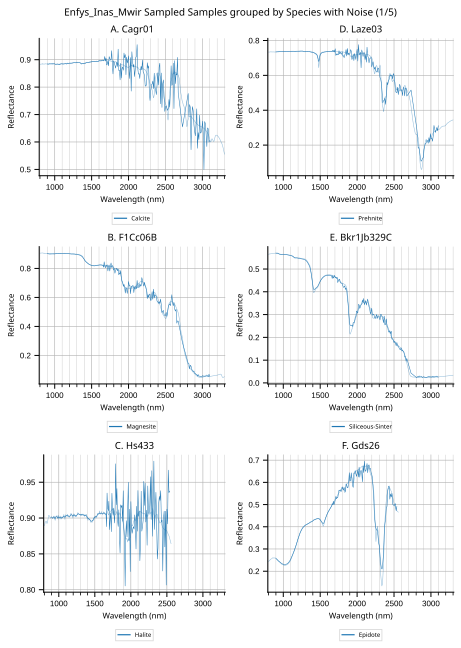

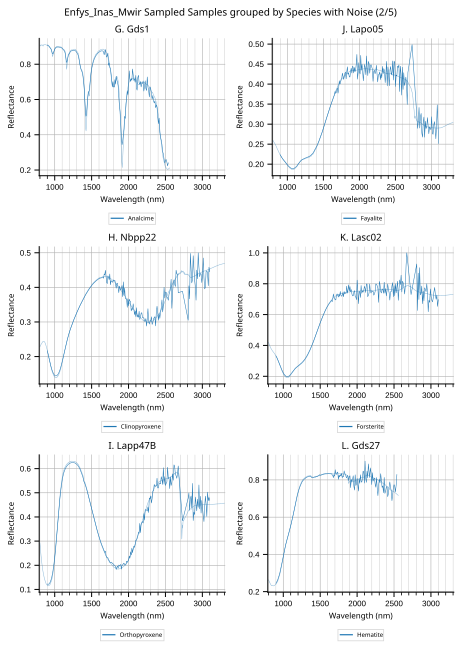

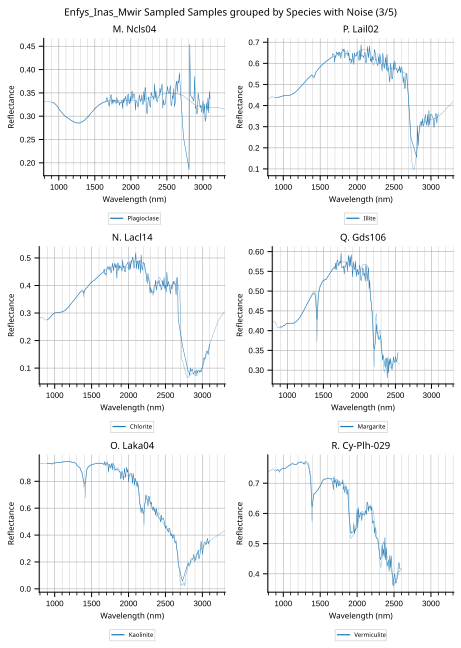

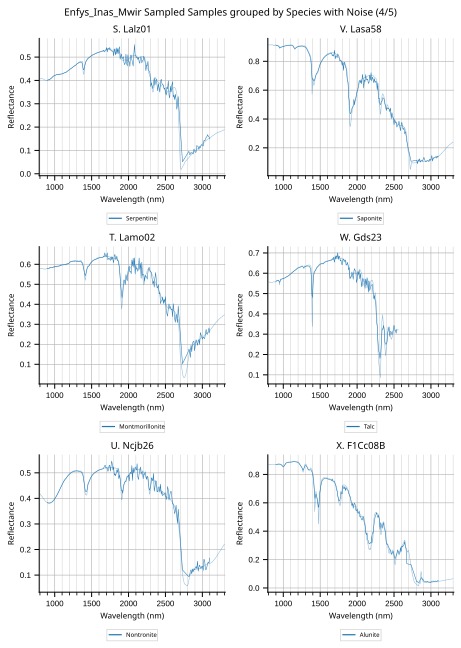

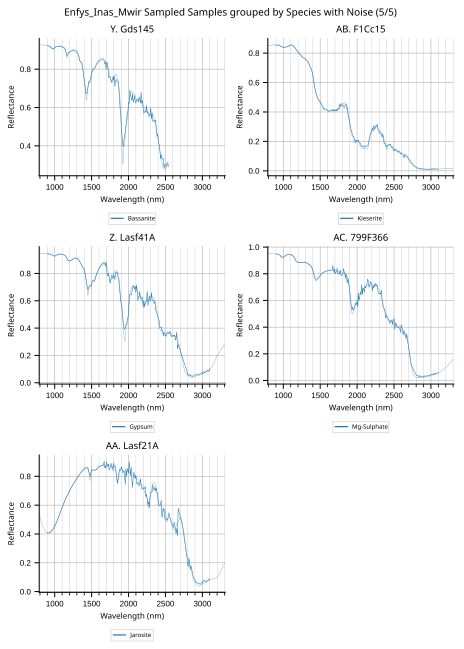

In [182]:
axes = obs.plot_profiles(scope='samples', groupby='Species', stacked=False, hires_under=True, ci=False)

**Figure 14** Detailled view of each entry in the spectral library, showing the scale of noise introduced, relative to the features of each spectrum, and the reflectance range.

Qualitatively, these plots illustrate that *Enfys* does not significantly intrude on the diagnostic features of these type specimen of minerals identified on the Mars surface. In some cases, we can see that doublet features are lost, but this is due to the spectral resolving power, rather than the additive noise. We will assess this in the discussion section.

We can export the dataset:

In [183]:
obs.export_main_df()

Exporting the Observation Pickle format...
Observation export complete.


## Continuum Removal

We can apply continuum removal, even to the noisy data.

In [184]:
from sptk.spectral_library_analyser import SpectralLibraryAnalyser as sla

cr_tool = sla(obs)
cr_obs = cr_tool.remove_continuum()

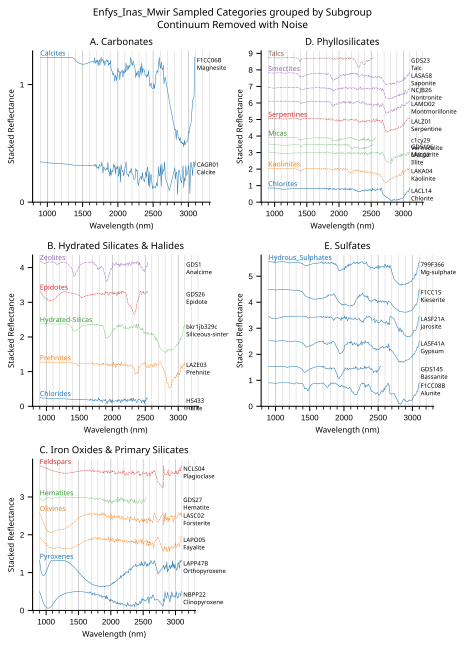

In [185]:
axes = cr_obs.plot_profiles(scope='categories', groupby='Subgroup', stacked=True, hires_under=False, ci=False)

**Figure 15** Continuum-Removed entries of the MICA Files, as sampled by *Enfys*, including synthetic noise.

Again, we can export this:

In [186]:
cr_obs.export_main_df()

Exporting the Observation Pickle format...
Observation export complete.


## Repeat Noisy Samples: Std. Dev. Confidence Intervals, Continuum-Removal, and Waterfall Visualisation

### Repeat Noisy Samples

There are several visualisations that we can produce that demonstrate the average signal over multiple repeatedly drawn noisy spectra. We can simualte this by setting the number of repeats to a larger number, e.g. 64.

In [187]:
_ = obs.add_noise(64, seed=0)

Now, we can plot the average spectrum for each entry, over the repeat noisy samples, with shading indicating the standard deviation of the noisy data, where the 'ci' keywrod has been applied ('ci': confidence-interval).

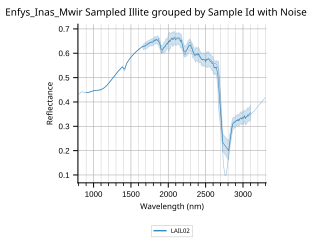

In [188]:
axes = obs.plot_profiles(scope='illite', groupby='Sample ID', stacked=False, hires_under=True, ci=True)

**Figure 16** Mean of Noisy resampled example spectrum for Illite, showing mean and standard deviation of 64 repeat samples according to the spectral signal-to-noise ratio illustrated in figure 3.B.

Here we find that the standard deviation is almost negligible at the scale of the figure.

Plotting out all of the groups, we again see that the noise, at this scale, is indeed negligible for most entries.

Negative level values detected
Negative level values detected


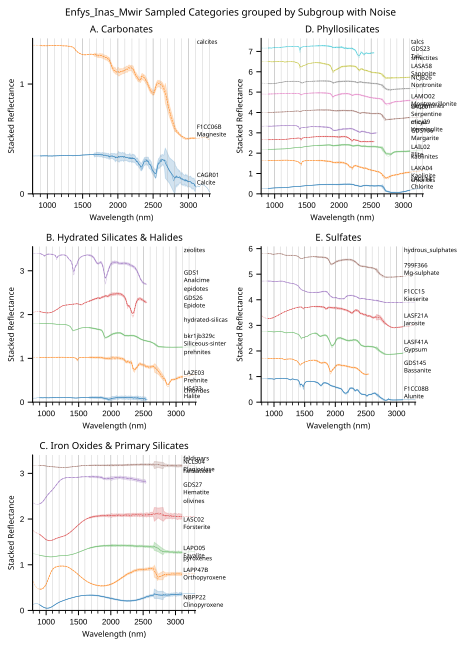

In [189]:
axes = obs.plot_profiles(scope='categories', groupby='Subgroup', stacked=True, hires_under=True, ci=True)

**Figure 17** The MICA files as sampled by *Enfys*, with repeat samples drawn according to the expected spectral Signal-to-Noise Ratio, with the original high-resolution spectra plotted underneath each.

The key conclusion to draw from the above figure is that expected noise for *Enfys* does not significantly intrude on the diagnostic features of these type specimen of minerals identified on the Mars surface.

To visualise the impact on the resolution of absorption features, we can show the continuum removed data. 
We need to recompute the continuum-removed data on this noisy set.

In [190]:
cr_tool = sla(obs)
cr_obs = cr_tool.remove_continuum()

Showing the data in the waterfall visualisation, each repeat noisy sample is shown as a sub-row for each entry.

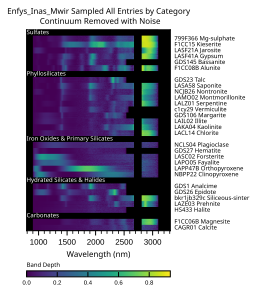

In [191]:
axes = cr_obs.plot_profiles(scope='all', groupby='Category', stacked=False, waterfall=True, ci=False)

**Figure 16** Continuum-Removed waterfall diagram of the entries of the MICA Files, as sampled by *Enfys*, including synthetic noise. Each entry bar is composed of *n* repeat noisy samples, such that each bar is composed of *n* rows, illustrating the noise.

We can see this clearer by plotting each entry independently.

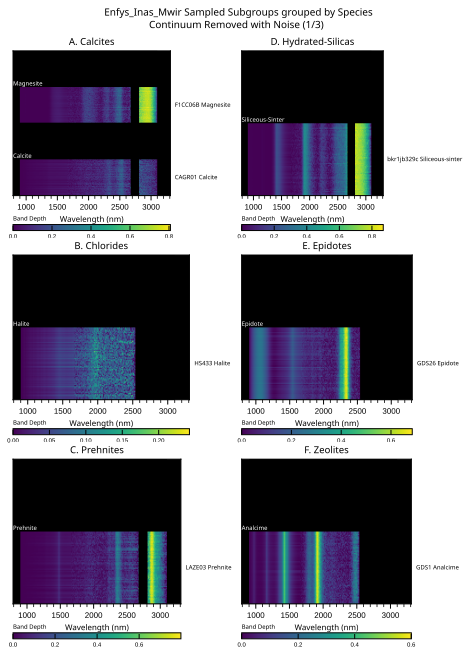

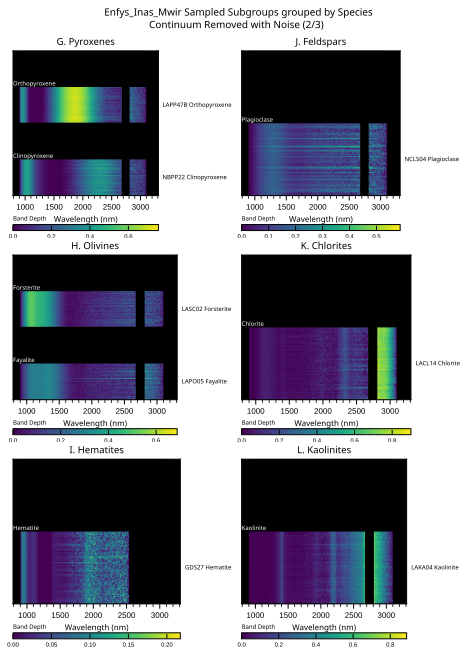

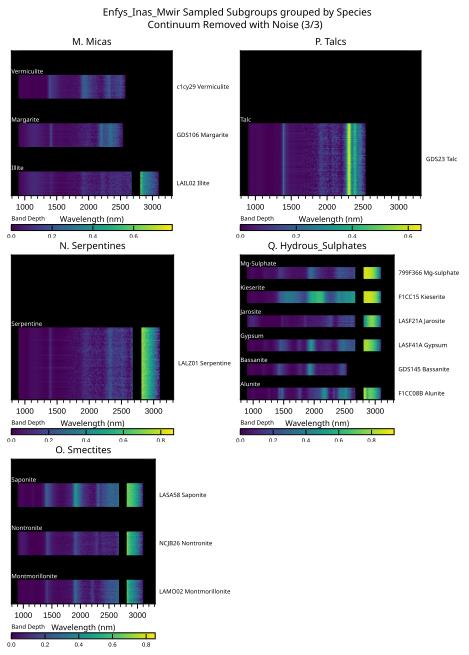

In [192]:
axes = cr_obs.plot_profiles(scope='subgroups', groupby='Species', stacked=False, waterfall=True, ci=False)

**Figure 17** Detailed waterfall view of each entry in the spectral library, showing the scale of noise introduced, relative to the features of each spectrum, and the reflectance range. Each entry bar is composed of *n* repeat noisy samples, such that each bar is composed of *n* rows, illustrating the noise.

This visualisations more clearly show how absorption features are resolved, and how noise impacts the different absorption features.

### Validating the Noise

We can check that our noise is correct by aggregating the repeat samples to give the mean and standard deviation for each entry and each spectral channel (wavelength).

We can then compare this to the spectral SNR.

In [193]:
signal = obs.main_df.groupby('Root Data ID').mean()
noise = obs.main_df.groupby('Root Data ID').std()
snr = signal/noise

/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2651352844.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  signal = obs.main_df.groupby('Root Data ID').mean()
/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2651352844.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  noise = obs.main_df.groupby('Root Data ID').std()


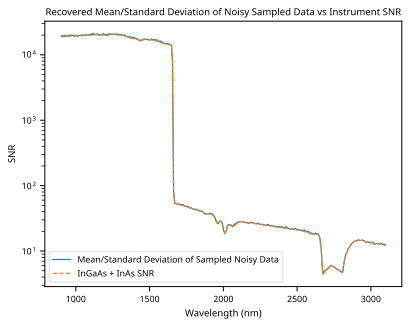

In [194]:
# plot the SNR
import seaborn as sns
# plot with log scale y axis
g = sns.lineplot(data=snr.mean(), label='Mean/Standard Deviation of Sampled Noisy Data', markers=True)
g.set(yscale="log")


# get instrument snr
sns.lineplot(data=obs.instrument.main_df, x='cwl', y='snr', label='InGaAs + InAs SNR', linestyle='--', markers=True)

g.set_xlabel('Wavelength (nm)')
g.set_ylabel('SNR')
title = g.set_title('Recovered Mean/Standard Deviation of Noisy Sampled Data vs Instrument SNR')

**Figure 18** Recovery of the instrument specified spectral Signal-to-Noise Ratio from the averaged repeat noisy samples over the standard deviation.

We can see that our method for simulating noise by drawing additive noise from the distribution according to noise defined by the signal Reflectance and the SNR does indeed recover the input spectral Signal-to-Noise Ratio.

# Discriminatory Evaluation with Spectral Angle Mapper

To evaluate the ability of Enfys to discriminate between the materials of the MICA files set, we will use the Spectral Angle to measure the distance between a given noisy spectrum and each clean entry of the MICA files. We expect the smallest Spectral Angle to occur for the matching material.

By running the evaluation on N-repeat noisy samples, we can estimate the propagation of the noise through the Spectral Angle. We can then compare this noise to the difference in Spectral Angle between the match and the next-nearest match, to understand the repeatability.

The Spectral Angle computation is closed-form, and can be formulated in a Linear Algebra representation that scales well with increasing sizes of spectral libraries.

## Spectral Angle Evaluation

Inputs:
- Test material name
- Test material noisy data
- MICA files clean data

Outputs:
- Spectral Angle for each MICA entry, and for each repeat noisy sample, order in increasing angle
- Plot of Spectral Angle results, showing score for each material, and the noisy spectrum vs the top 3 matches
- Plot of mean Spectral Angle result, with errorbars, to show if final material detection is statistically significant

First, let's get a new noisy dataset with 128 repeat noisy samples for each material.

In [274]:
noise_obs = obs.add_noise(128, seed=0)

Now we take a material from the data set, and get the noisy entries for that material, and the clean dataset for the entire MICA files.

In [275]:
# getting the material entry to test
materials = obs.main_df['Root Data ID'].unique()
test_material = materials[0]
test_material

'CAGR01 Calcite'

Getting the noisy dataset for this material:

In [276]:
noisy_data = obs.get_refl_df(root_data_id=test_material).to_numpy()
noisy_data.shape

(128, 299)

We need to define the 'bad bands' in the dataset, i.e. where the reflectance is NaN, and set these to 0, so that they don't contribute to the summations in the Spectral Angle.

In [277]:
# find the Bad bands
bad_bands = ~np.isfinite(noisy_data[0,:])
noisy_data = np.where(bad_bands, 0, noisy_data) # set all nan values to 0

getting the clean data for all materials in the MICA set:

In [278]:
clean_data = obs.noiseless_df[obs.wvls].to_numpy()
clean_data.shape

(29, 299)

Similarly, we take the previously defined 'bad bands', from the noisy dataset, and then also set any missing values in the clean dataset (e.g., where a spectrum is only defined up to 2.5 µm), and set these values to 0 also.

In [279]:
# get clean data
clean_data = obs.noiseless_df[obs.wvls].to_numpy()
clean_data = np.where(bad_bands, 0, clean_data) # 0 the clean data where the noisy data is NaN
clean_data = np.where(~np.isfinite(clean_data), 0, clean_data) # 0 the clean data where the clean data is NaN

The Spectral Angle is defined between the noisy spectrum $\tilde{R}_i[\lambda]$ of material $i$ in the set of MICA file materials ($\mathcal{M}$) and the clean spectrum $R_j[\lambda]$, where $j \in \mathcal{M}$.

The Spectral Angle $\theta$ is:

$$\theta(i,j) = \arccos \left( \frac{\sum_{\lambda} \tilde{R}_i[\lambda] {R}_j[\lambda]}{ \left(\sum_{\lambda} \tilde{R}_i[\lambda]^2 \right)^{1/2} \left(\sum_{\lambda} R_j[\lambda]^2 \right)^{1/2} }  \right) $$

We can formulate the numerator $\sum_{\lambda} \tilde{R}_i[\lambda] {R}_j[\lambda]$ as

In [280]:
numerator = np.inner(noisy_data, clean_data)
numerator.shape

(128, 29)

and the denominator parts as:

In [281]:
denominator = np.outer(np.sqrt(np.sum(noisy_data**2, axis=1)), np.sqrt(np.sum(clean_data**2, axis=1)))
denominator.shape

(128, 29)

we can then combine these to compute the Spectral Angle as:

In [282]:
sa = np.arccos(numerator / denominator)
sa.shape

(128, 29)

The Spectral Angle numpy array that this produces has dimensions of (n-repeats, m-entries).

We can package this into a DataFrame:

In [283]:
sa_df = pd.DataFrame(sa, index=obs.get_refl_df(root_data_id=test_material).index, columns=obs.noiseless_df.index)

To visualise, first let's take the average Spectral Angle across all of the observations, and also compute the standard deviation.

In [284]:
# Now let's order the sa_df DataFrame columns in ascending mean value order
sa_df = sa_df.loc[:, sa_df.mean(axis=0).sort_values().index]

In [285]:
sa_ave = sa_df.mean(axis=0)
sa_std = sa_df.std(axis=0)

Now let's order the sa_df DataFrame columns in ascending mean value order

In [286]:
sa_ave.sort_values().index

Index(['CAGR01 Calcite', 'NCLS04 Plagioclase', 'LAIL02 Illite',
       'LAMO02 Montmorillonite', 'LAZE03 Prehnite', 'NCJB26 Nontronite',
       'LALZ01 Serpentine', 'LAKA04 Kaolinite', 'LACL14 Chlorite',
       'F1CC06B Magnesite', 'LASA58 Saponite', 'LASF21A Jarosite',
       '799F366 Mg-sulphate', 'NBPP22 Clinopyroxene', 'LAPO05 Fayalite',
       'LASF41A Gypsum', 'HS433 Halite', 'c1cy29 Vermiculite',
       'bkr1jb329c Siliceous-sinter', 'F1CC08B Alunite', 'GDS106 Margarite',
       'GDS23 Talc', 'LAPP47B Orthopyroxene', 'GDS1 Analcime',
       'GDS145 Bassanite', 'GDS27 Hematite', 'LASC02 Forsterite',
       'GDS26 Epidote', 'F1CC15 Kieserite'],
      dtype='object', name='Data ID')

Now collecting all of these functions in a set of callable functions, such that we can run this analysis on each entry.

Here we also compute a 'baseline' Spectral Angle, between each clean entry and each other clean entry.

In [490]:
def spectral_angle(data_a, data_b):
    # compute spectal angle
    numerator = np.inner(data_a, data_b) #TODO replace inner with nansum
    denominator = np.outer(np.sqrt(np.sum(data_a**2, axis=1)), np.sqrt(np.sum(data_b**2, axis=1)))
    sa = np.arccos(numerator / denominator)
    return sa

def compute_spectral_angle(obs, material_name):
    # get noisy data
    noisy_data = obs.get_refl_df(root_data_id=material_name).to_numpy()
    bad_bands = ~np.isfinite(noisy_data[0,:])
    noisy_data = np.where(bad_bands, 0, noisy_data) # set all nan values to 0

    # get clean data
    clean_data = obs.noiseless_df[obs.wvls].to_numpy()
    clean_data = np.where(bad_bands, 0, clean_data) # 0 the clean data where the noisy data is NaN
    clean_data = np.where(~np.isfinite(clean_data), 0, clean_data) # 0 the clean data where the clean data is NaN

    sa_noisy = spectral_angle(noisy_data, clean_data)

    # get baseline Spectral Angle
    baseline_data = obs.noiseless_df.loc[material_name][obs.wvls].to_numpy() 
    baseline_data = np.expand_dims(baseline_data, axis=0).astype(np.float64)  
    baseline_data = np.where(bad_bands, 0, baseline_data) # 0 the clean data where the noisy data is NaN
    baseline_data = np.where(~np.isfinite(baseline_data), 0, baseline_data) # 0 the clean data where the clean data is NaN

    sa_baseline = spectral_angle(baseline_data, clean_data)

    # package in DF
    sa_df = pd.DataFrame(sa_noisy, index=obs.get_refl_df(root_data_id=material_name).index, columns=obs.noiseless_df.index)
    sa_bl = pd.Series(sa_baseline.squeeze(), index=obs.noiseless_df.index)
    # set sa_bl for index of material_name to 0
    sa_bl.loc[material_name] = 0.0

    # order DF columns in baseline value order
    sa_df = sa_df.loc[:, sa_bl.sort_values().index]
    sa_bl = sa_bl.loc[sa_bl.sort_values().index]

    return sa_df, sa_bl

In [288]:
sa_df, sa_bl = compute_spectral_angle(obs, test_material)

In [289]:
from matplotlib import pyplot as plt

In [ ]:
def plot_spectral_angle_noisy_map(sa_df, material_name, top_n=10, ax: plt.Axes=None):
    if ax is None:
        fig, ax = plt.subplots()
    else:
        fig = ax.figure

    top_n_sa_df = sa_df.iloc[:,:top_n]

    im = ax.imshow(top_n_sa_df.to_numpy(), 
                cmap='viridis_r', 
                interpolation='none', resample=False,
                # vmin=0, vmax=1,
                aspect='auto')
    # add color bar called 'Spectral Angle'
    ax.set_xlabel('Entry Ranked by Asc. Baseline Spectral Angle')
    ax.set_ylabel('N-Repeat')
    cbar = ax.figure.colorbar(im, ax=ax, location='right')
    cbar.ax.set_ylabel('Spectral Angle')
    # use index for axis labels
    # set every tickmark to the corresponding index
    xticks=ax.set_xticks(np.arange(len(top_n_sa_df.columns))+0.5)
    xlbls=ax.set_xticklabels(top_n_sa_df.columns.to_list(), rotation=60, horizontalalignment='right', verticalalignment='top')

    # add vertical gridlines    
    ax.grid(which='major', axis='x', color='white', linestyle='-', linewidth=0.2)

    # add a top y-axis called Match Rank, with ticks aligned to the right
    ax2 = ax.twiny()
    ax2.set_xlim(ax.get_xlim())
    ax2.set_xticks(np.arange(len(top_n_sa_df.columns))+0.5)
    ax2.set_xticklabels(np.arange(1, len(top_n_sa_df.columns)+1), horizontalalignment='right', verticalalignment='bottom', fontsize=7)
    ax2.set_xlabel('Match Rank')

    fig.suptitle(f'{material_name} Spectral Angle Match')
    fig.tight_layout()

    return fig, ax

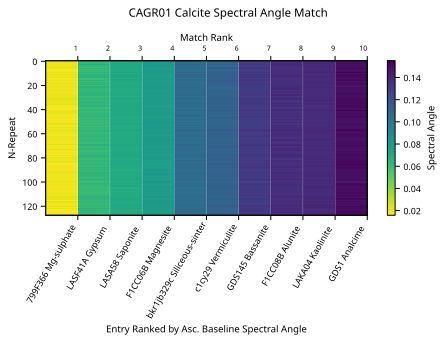

In [300]:
fig, ax = plot_spectral_angle_noisy_map(sa_df, test_material)

In [304]:
# alternatively, we can plot the Spectal Angle score against the entry
def plot_mean_spectral_angle(sa_df, sa_bl, material_name, top_n: int=10, ax: plt.Axes=None):
    if ax is None:
        fig, ax = plt.subplots()
    else:
        fig = ax.figure

    top_n_sa_df = sa_df.iloc[:,:top_n]

    ax.plot(top_n_sa_df.mean(axis=0), marker='o', label='Ave. ± Std. Dev.')
    ax.plot(sa_bl[:top_n], marker='o', label='Baseline', linestyle='--')
    ax.legend(loc='upper left')
    # set ylimits
    # ax.set_ylim(0, 1)
    # add error bars
    ax.errorbar(np.arange(len(top_n_sa_df.columns)), top_n_sa_df.mean(axis=0), yerr=top_n_sa_df.std(axis=0), fmt='o', capsize=5)
    ax.fill_between(np.arange(len(top_n_sa_df.columns)), top_n_sa_df.mean(axis=0) - top_n_sa_df.std(axis=0), top_n_sa_df.mean(axis=0) + top_n_sa_df.std(axis=0), alpha=0.2)
    ax.set_ylabel('Mean Spectral Angle $\pm \sigma$')
    ax.set_xlabel('Entry Ranked by Asc. Baseline Spectral Angle')
    ax.set_xticks(top_n_sa_df.columns.to_list())
    xlbls=ax.set_xticklabels(top_n_sa_df.columns.to_list(), rotation=60, horizontalalignment='right', verticalalignment='top')

    # add vertical gridlines    
    ax.grid(which='major', axis='x', color='gray', linestyle='-', linewidth=0.2)

    # add a top x-axis called Match Rank, with ticks aligned to the right
    ax2 = ax.twiny()
    ax2.set_xlim(ax.get_xlim())
    ax2.set_xticks(np.arange(len(top_n_sa_df.columns)))
    ax2.set_xticklabels(np.arange(1, len(top_n_sa_df.columns)+1), horizontalalignment='right', verticalalignment='center', fontsize=7)
    x2lbls=ax2.set_xlabel('Match Rank')

    title = f'{material_name} Mean Spectral Angle Match'
    fig.suptitle(title)

    return fig, ax

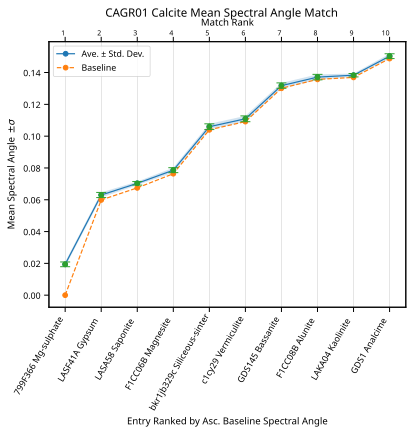

In [305]:
fig, ax = plot_mean_spectral_angle(sa_df, sa_bl, test_material)

Finally, let's plot the top 3 results in a spectral library analyser plot.

In [309]:
top3 = sa_df.mean(axis=0).sort_values().index[:3].to_list()
top3

['799F366 Mg-sulphate', 'LASF41A Gypsum', 'LASA58 Saponite']

It will be more convenient to show single-drawn noisy samples here, so we will make another observation object, that only draws 1 repeat sample.

In [295]:
obs_1 = Observation(
    material_collection=matcol,
    instrument = enfys,
    load_existing=False,
    plot_profiles=False,
    export_df=False)

Building new Observation DataFrame                                                  for 'enfys_mica_inas_mwir_snr10x'...
Sampling the Material Collection with the Instrument...
Sampling complete.


In [347]:
_ = obs_1.add_noise(1, seed=0)

In [530]:
top3

['HS433 Halite', 'CAGR01 Calcite', 'NCLS04 Plagioclase']

In [531]:
top3_obs_df

,Category,Sample ID,Species,Subgroup,Group,Library,Sample Description,Date Added,Viewing Geometry,Other Information,...,3011.83736494,3021.57325265,3031.3119922,3041.05356775,3050.79796359,3060.54516415,3070.29515395,3080.04791767,3089.80344009,3099.5617061
Root Data ID,,,,,,,,,,,,,,,,,,,,,
LASA58 Saponite,phyllosilicates,LASA58,saponite,smectites,phyllosilicates,MICA_new_dirtree,NaN,NaN,NaN,NaN,...,0.146478,0.108265,0.128274,0.132241,0.134276,0.135894,0.141337,0.127971,0.142930,0.139436
LASF41A Gypsum,sulfates,LASF41A,gypsum,hydrous_sulphates,sulphates,MICA_new_dirtree,NaN,NaN,NaN,NaN,...,0.081119,0.075983,0.073125,0.082609,0.083115,0.085898,0.094815,0.086090,0.087183,0.103176
799F366 Mg-sulphate,sulfates,799F366,mg-sulphate,hydrous_sulphates,sulphates,MICA_new_dirtree,NaN,NaN,NaN,NaN,...,0.047242,0.042593,0.044539,0.056174,0.045235,0.050189,0.057041,0.054660,0.059249,0.057248


In [603]:
def plot_top3_matches(obs, matcol, material_name, top3, ax: plt.Axes=None):
    if ax is None:
        fig, ax = plt.subplots()
    else:
        fig = ax.figure

    top3_hires_df = matcol.main_df.loc[top3]
    refl_df_top3_hires = top3_hires_df[matcol.wvls]

    top3_obs_df = obs.main_df[obs.main_df['Root Data ID'].isin(top3)]
    # set Root Data ID as index
    top3_obs_df = top3_obs_df.set_index('Root Data ID')
    refl_df_top3 = top3_obs_df[obs.wvls]

    # get reverse order of top3
    top3_r = top3[::-1]
        
    refl_df_top3 = refl_df_top3.loc[top3_r]
    refl_df_top3_hires = refl_df_top3_hires.loc[top3_r]

    minima = refl_df_top3.min(axis=1)
    maxima = refl_df_top3.max(axis=1)
    spec_range = maxima - minima
    max_range = (spec_range).max()

    # offset the reflectance
    padding =  max_range * 1/6
    spec_range[spec_range < padding] = padding
    offsets = - minima + (spec_range+padding).cumsum().shift(periods=1, fill_value = 0) + padding/2   

    # # apply offsets to each entry
    # offsets = refl_df_top3.max(axis=1).cumsum()

    refl_df_top3 = refl_df_top3.add(offsets, axis=0)
    refl_df_top3_hires = refl_df_top3_hires.add(offsets, axis=0)

    maxima = refl_df_top3_hires.max(axis=1)

    cmap = plt.get_cmap('tab10_r')

    refl_df_top3_hires.T.plot(ax=ax, linewidth=0.8)
    l = ax.get_lines()
    refl_df_top3.T.plot(ax=ax, color=[i.get_color() for i in l])
    
    # add padding to y lim
    # get ylim
    ylim = ax.get_ylim()
    ax.set_ylim(ylim[0], ylim[1]+padding)

    # despine
    sns.despine(ax=ax)

    # xlabel
    ax.set_xlabel('Wavelength (nm)')
    # ylabel
    ax.set_ylabel('Stacked Reflectance')

    # no legend
    ax.legend().set_visible(False)

    # annotate with the top3 at the end of each plot line
    for i, line in enumerate(l):
        ax.annotate(f'{3-i}. {top3_r[i]}', xy=(line.get_xdata()[0], maxima[top3_r[i]]+padding), color=line.get_color())

    ax.set_title(f'Top 3 {material_name} Spectral Angle Matches')

    return fig, ax

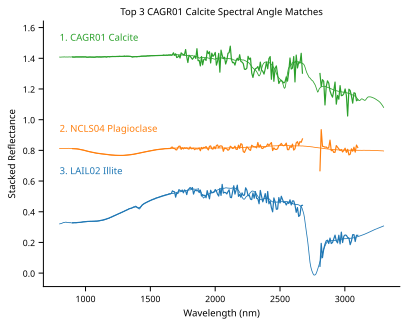

In [606]:
for material in materials[0:1]:
    sa_df, sa_bl = compute_spectral_angle(obs, material)
    top3 = sa_bl.index[:3].to_list()
    fig, ax = plot_top3_matches(obs_1, matcol, material, top3)

Evaluating Spectral Angle for CAGR01 Calcite
Evaluating Spectral Angle for F1CC06B Magnesite
Evaluating Spectral Angle for HS433 Halite
Evaluating Spectral Angle for LAZE03 Prehnite
Evaluating Spectral Angle for bkr1jb329c Siliceous-sinter
Evaluating Spectral Angle for GDS26 Epidote
Evaluating Spectral Angle for GDS1 Analcime


/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2817336622.py:5: RuntimeWarning: invalid value encountered in arccos
  sa = np.arccos(numerator / denominator)


Evaluating Spectral Angle for NBPP22 Clinopyroxene
Evaluating Spectral Angle for LAPP47B Orthopyroxene
Evaluating Spectral Angle for LAPO05 Fayalite


/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2817336622.py:5: RuntimeWarning: invalid value encountered in arccos
  sa = np.arccos(numerator / denominator)


Evaluating Spectral Angle for LASC02 Forsterite
Evaluating Spectral Angle for GDS27 Hematite


/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2817336622.py:5: RuntimeWarning: invalid value encountered in arccos
  sa = np.arccos(numerator / denominator)


Evaluating Spectral Angle for NCLS04 Plagioclase
Evaluating Spectral Angle for LACL14 Chlorite


/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2817336622.py:5: RuntimeWarning: invalid value encountered in arccos
  sa = np.arccos(numerator / denominator)


Evaluating Spectral Angle for LAKA04 Kaolinite


/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2817336622.py:5: RuntimeWarning: invalid value encountered in arccos
  sa = np.arccos(numerator / denominator)


Evaluating Spectral Angle for LAIL02 Illite


/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2817336622.py:5: RuntimeWarning: invalid value encountered in arccos
  sa = np.arccos(numerator / denominator)


Evaluating Spectral Angle for GDS106 Margarite


/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2817336622.py:5: RuntimeWarning: invalid value encountered in arccos
  sa = np.arccos(numerator / denominator)


Evaluating Spectral Angle for c1cy29 Vermiculite


/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2817336622.py:5: RuntimeWarning: invalid value encountered in arccos
  sa = np.arccos(numerator / denominator)


Evaluating Spectral Angle for LALZ01 Serpentine


/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2817336622.py:5: RuntimeWarning: invalid value encountered in arccos
  sa = np.arccos(numerator / denominator)


Evaluating Spectral Angle for LAMO02 Montmorillonite
Evaluating Spectral Angle for NCJB26 Nontronite


/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2817336622.py:5: RuntimeWarning: invalid value encountered in arccos
  sa = np.arccos(numerator / denominator)
/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/905498425.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1,3, figsize=(12,6))


Evaluating Spectral Angle for LASA58 Saponite
Evaluating Spectral Angle for GDS23 Talc
Evaluating Spectral Angle for F1CC08B Alunite
Evaluating Spectral Angle for GDS145 Bassanite


/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2817336622.py:5: RuntimeWarning: invalid value encountered in arccos
  sa = np.arccos(numerator / denominator)


Evaluating Spectral Angle for LASF41A Gypsum


/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2817336622.py:5: RuntimeWarning: invalid value encountered in arccos
  sa = np.arccos(numerator / denominator)


Evaluating Spectral Angle for LASF21A Jarosite
Evaluating Spectral Angle for F1CC15 Kieserite
Evaluating Spectral Angle for 799F366 Mg-sulphate


/var/folders/w4/44k32f413dd82lxmtw9456w80000gp/T/ipykernel_91586/2817336622.py:5: RuntimeWarning: invalid value encountered in arccos
  sa = np.arccos(numerator / denominator)


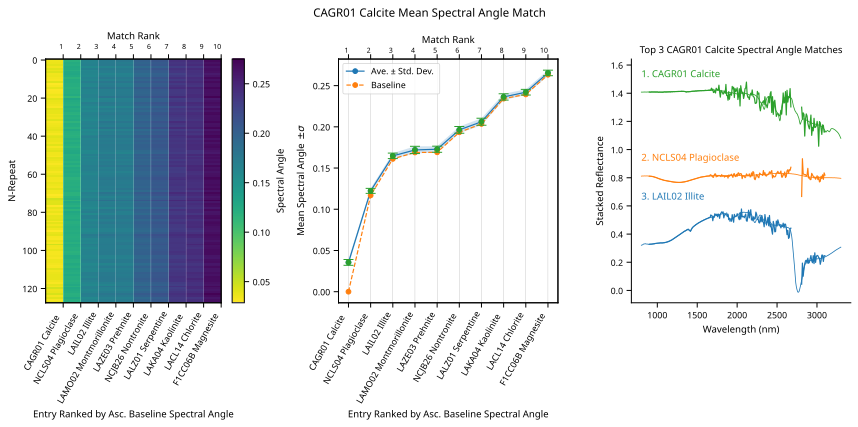

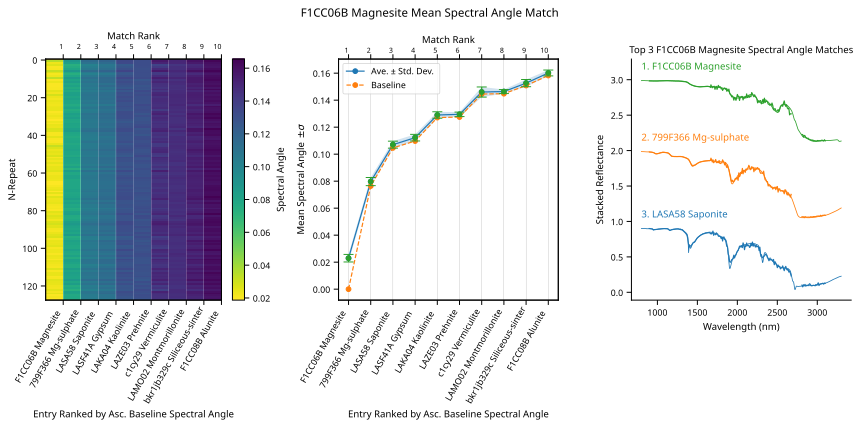

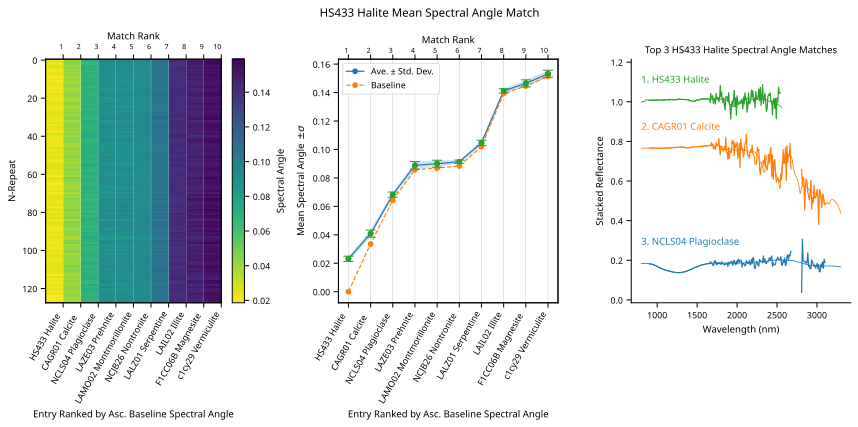

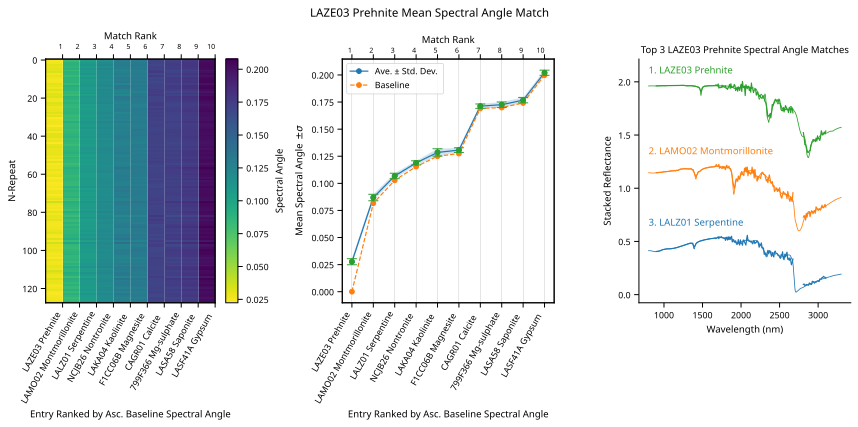

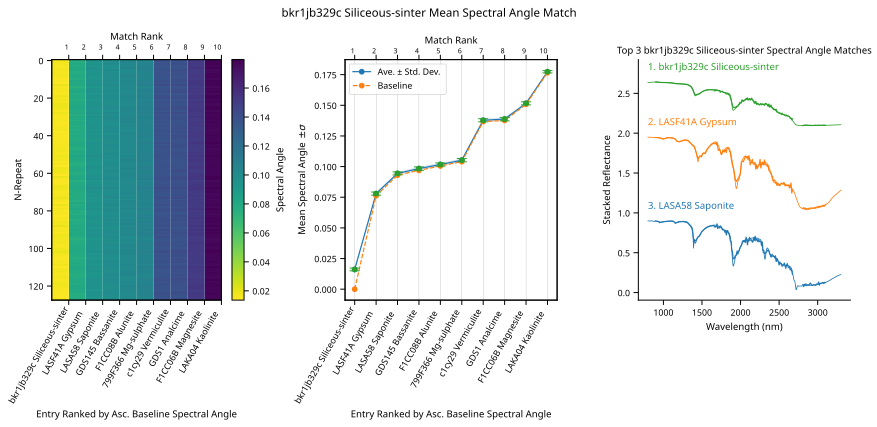

...

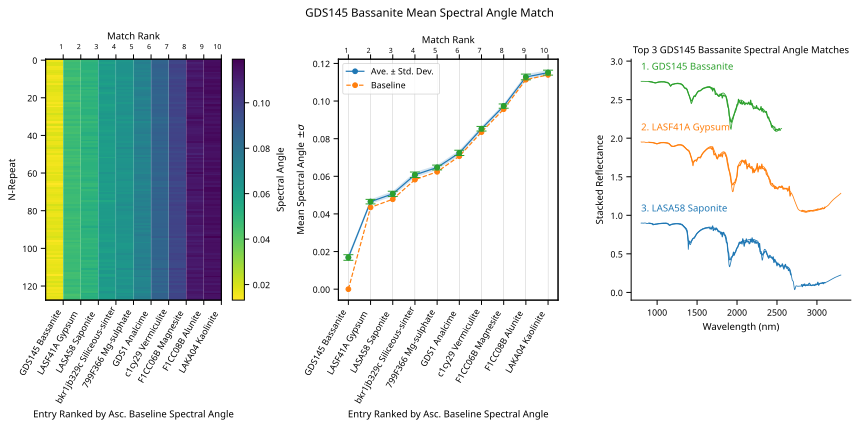

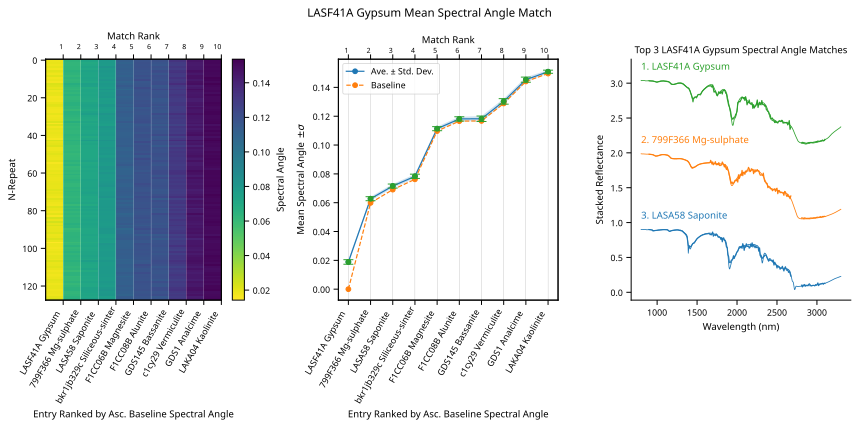

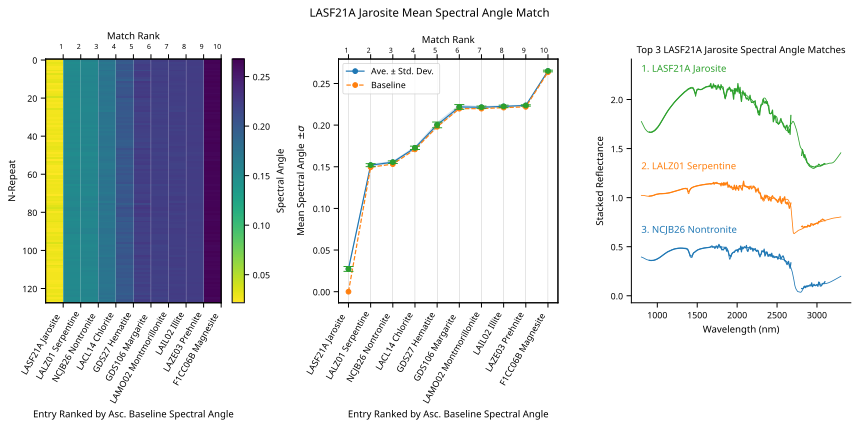

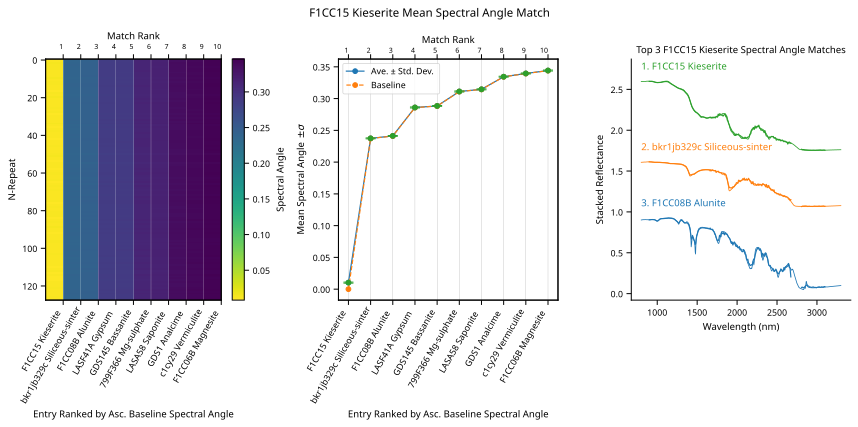

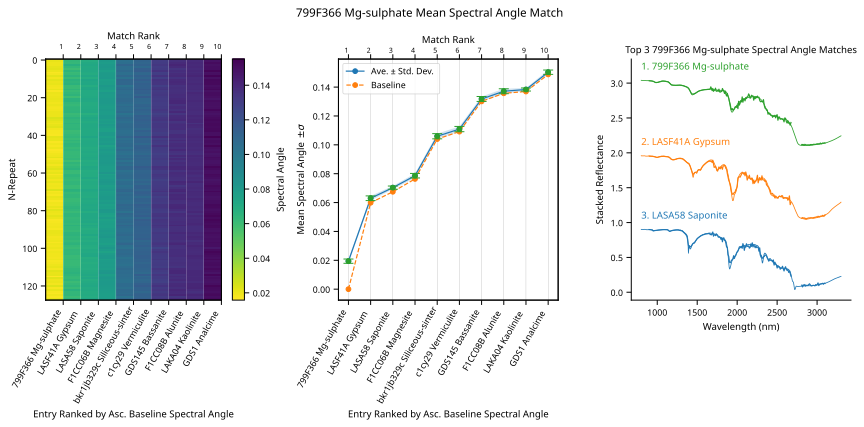

In [607]:
for material in materials:
    print(f'Evaluating Spectral Angle for {material}')
    sa_df, sa_bl = compute_spectral_angle(obs, material)

    fig, axes = plt.subplots(1,3, figsize=(12,6))

    fig, ax = plot_spectral_angle_noisy_map(sa_df, material, ax=axes[0])
    # fig.savefig(f'../reports/figures/{PROJECT_NAME}_{material}_spectral_angle_map.png', dpi=300, bbox_inches='tight')
    # plt.close(fig)

    fig, ax = plot_mean_spectral_angle(sa_df, sa_bl, material, ax=axes[1])
    # fig.savefig(f'../reports/figures/{PROJECT_NAME}_{material}_mean_spectral_angle.png', dpi=300, bbox_inches='tight')
    # plt.close(fig)

    top3 = sa_bl.index[:3].to_list()
    fig, ax = plot_top3_matches(obs_1, matcol, material, top3, ax=axes[2])

    fig.tight_layout()

# Discussion

Notes on what we found above, perhaps with some more analysis.

# Conclusions

Concluding remarks and summary of findings.

# References